In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from glob import glob

import IPython.display as ipd
from tqdm import tqdm
import subprocess

plt.style.use("ggplot")

In [2]:
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/driving-video-with-object-tracking/mot_labels.csv
/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/02506726-0e9b815e.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/01317a31-6ea7d85d.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0153f03b-3b26c404.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/007c11bf-f6da335c.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/01461010-eeca4bf2.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00f7eac8-5193d600.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00ccf2e8-59a6bfc9.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k

In [158]:
input_file = '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0182320b-bb377e4e.mov'

subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '0182320b-bb377e4e.mp4',
                '-loglevel',
                'quiet']
              )

ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)


CompletedProcess(args=['ffmpeg', '-i', '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0182320b-bb377e4e.mov', '-qscale', '0', '0182320b-bb377e4e.mp4', '-loglevel', 'quiet'], returncode=0)

In [159]:
!ls -GFlash --color

total 157M
4.0K drwxr-xr-x 3 root 4.0K Apr 15 23:26 ./
4.0K drwxr-xr-x 5 root 4.0K Apr 15 22:42 ../
4.0K drwxr-xr-x 2 root 4.0K Apr 15 22:42 .virtual_documents/
9.0M -rw-r--r-- 1 root 9.0M Apr 15 23:25 007693e6-c2a8b9a7.mp4
 22M -rw-r--r-- 1 root  22M Apr 15 22:54 00a820ef-d655700e.mp4
 17M -rw-r--r-- 1 root  17M Apr 15 23:08 00ac3256-0f8e2cda.mp4
 18M -rw-r--r-- 1 root  18M Apr 15 23:13 00d79c0a-23bea078.mp4
 20M -rw-r--r-- 1 root  20M Apr 15 23:10 0166faa5-5fbc53c5.mp4
 23M -rw-r--r-- 1 root  23M Apr 15 23:27 0182320b-bb377e4e.mp4
 25M -rw-r--r-- 1 root  25M Apr 15 23:05 019c8305-0bb153d0.mp4
 14M -rw-r--r-- 1 root  14M Apr 15 23:12 025b2ded-11363432.mp4
 12M -rw-r--r-- 1 root  12M Apr 15 23:02 0289eba3-1c552656.mp4
4.0K ---------- 1 root  263 Apr 15 22:42 __notebook_source__.ipynb


In [160]:
ipd.Video('0182320b-bb377e4e.mp4', width = 700)

In [161]:
cap = cv2.VideoCapture("0182320b-bb377e4e.mp4")

In [162]:
cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT)

2403.0

In [163]:
height = cap.get(cv2.cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.cv2.CAP_PROP_FRAME_WIDTH)
print(f"Height {height}, Width {width}")

Height 720.0, Width 1280.0


In [164]:
fps = cap.get(cv2.cv2.CAP_PROP_FPS)
print(f"FPS : {fps : 0.2f}")

FPS :  59.94


In [165]:
cap.release()

In [166]:
cap = cv2.VideoCapture("0182320b-bb377e4e.mp4")
ret, img = cap.read()
print(f"Returned {ret} and img of shape {img.shape}")

Returned True and img of shape (720, 1280, 3)


In [167]:
# Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize = (10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize = figsize)
    ax.imshow(img_)
    ax.axis("off")

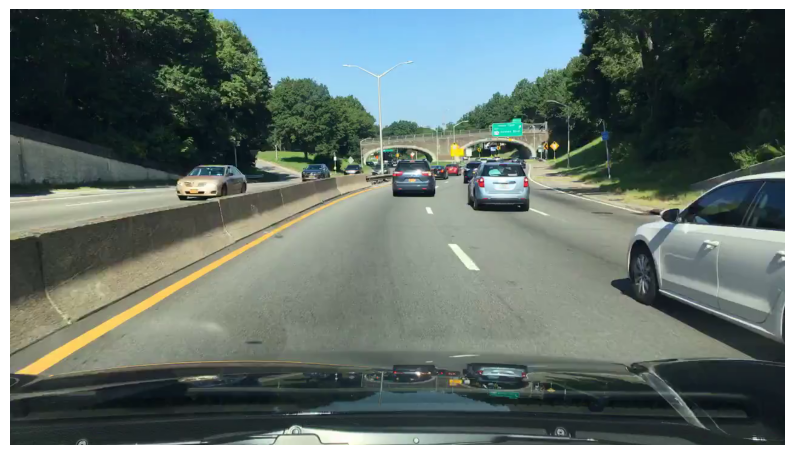

In [168]:
display_cv2_img(img)

In [169]:
cap.release()

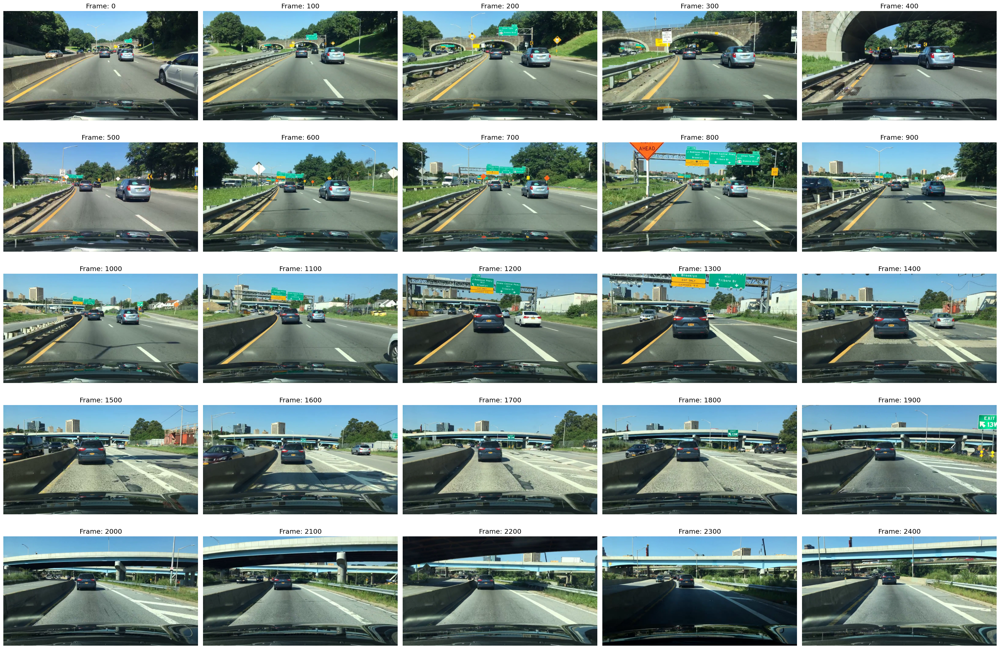

In [170]:
# Display multiple frames from the video
fig, axs = plt.subplots(5, 5, figsize = (30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("0182320b-bb377e4e.mp4")
n_frames = int(cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f"Frame: {frame}")
        axs[img_idx].axis("off")
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Add Annotations to Video Images

In [171]:
labels = pd.read_csv('../input/driving-video-with-object-tracking/mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "0182320b-bb377e4e"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [172]:
video_labels["category"].value_counts()

car              1736
pedestrian         51
other vehicle      25
truck              16
bus                 6
Name: category, dtype: int64

In [173]:
# Pull frame 1035

cap = cv2.VideoCapture("0182320b-bb377e4e.mp4")
n_frames = int(cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

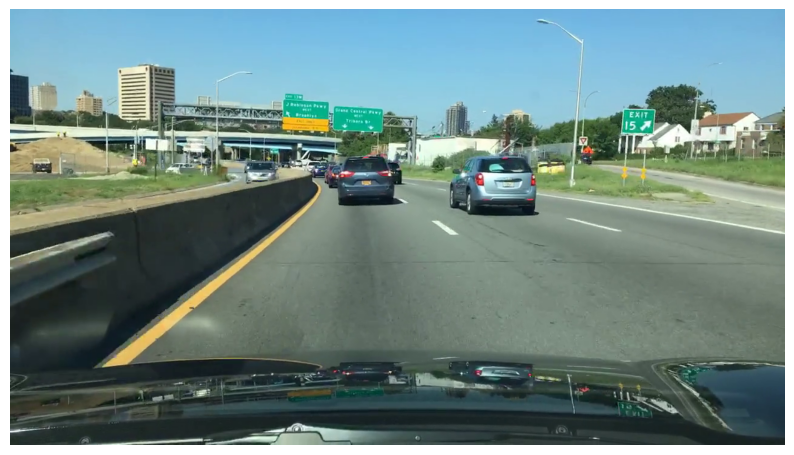

In [174]:
display_cv2_img(img)

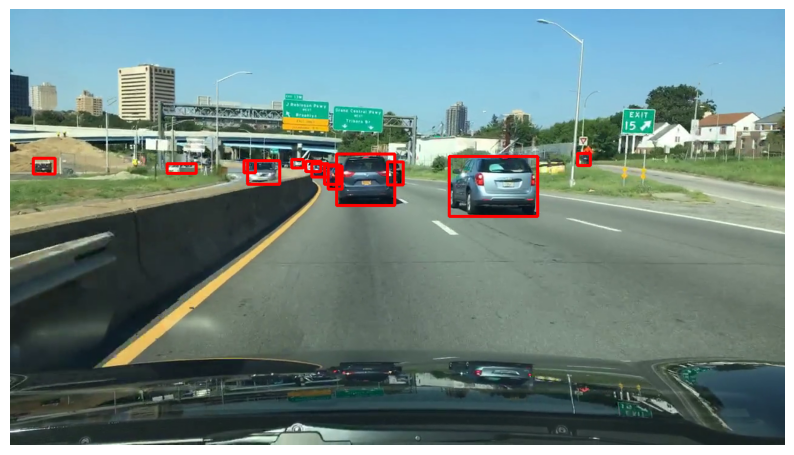

In [175]:
img_example = img.copy()
frame_labels = video_labels.query("video_frame == 1035")

for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)
    
display_cv2_img(img_example)

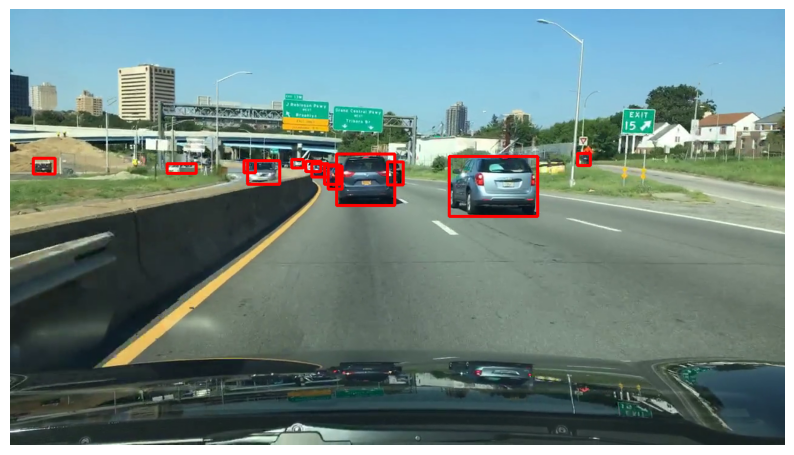

In [182]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query("video_frame == 1035")
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

# Adding Text

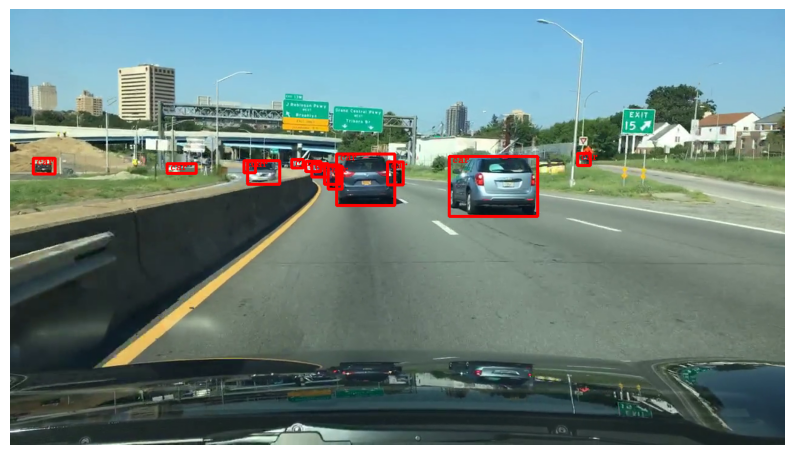

In [180]:
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)
cap.release()

# Label and Output Annotated Video

In [183]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [184]:
!rm -r out_test.mp4

rm: cannot remove 'out_test.mp4': No such file or directory


In [185]:
VIDEO_CODEC = "mp4v"
fps = 2403
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                     cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                     fps,
                     (width, height))

cap = cv2.VideoCapture("0182320b-bb377e4e.mp4")
n_frames = int(cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total = n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
    
out.release()
cap.release()

100%|██████████| 2403/2403 [00:44<00:00, 54.02it/s]


# Convert our labeled output to mp4 and view

In [187]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)


CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [188]:
!ls -GFlash --color

total 300M
4.0K drwxr-xr-x 3 root 4.0K Apr 15 23:47 ./
4.0K drwxr-xr-x 5 root 4.0K Apr 15 22:42 ../
4.0K drwxr-xr-x 2 root 4.0K Apr 15 22:42 .virtual_documents/
9.0M -rw-r--r-- 1 root 9.0M Apr 15 23:25 007693e6-c2a8b9a7.mp4
 22M -rw-r--r-- 1 root  22M Apr 15 22:54 00a820ef-d655700e.mp4
 17M -rw-r--r-- 1 root  17M Apr 15 23:08 00ac3256-0f8e2cda.mp4
 18M -rw-r--r-- 1 root  18M Apr 15 23:13 00d79c0a-23bea078.mp4
 20M -rw-r--r-- 1 root  20M Apr 15 23:10 0166faa5-5fbc53c5.mp4
 23M -rw-r--r-- 1 root  23M Apr 15 23:27 0182320b-bb377e4e.mp4
 25M -rw-r--r-- 1 root  25M Apr 15 23:05 019c8305-0bb153d0.mp4
 14M -rw-r--r-- 1 root  14M Apr 15 23:12 025b2ded-11363432.mp4
 12M -rw-r--r-- 1 root  12M Apr 15 23:02 0289eba3-1c552656.mp4
4.0K ---------- 1 root  263 Apr 15 22:42 __notebook_source__.ipynb
107M -rw-r--r-- 1 root 107M Apr 15 23:44 out_test.mp4
 37M -rw-r--r-- 1 root  37M Apr 15 23:47 out_test_compressed.mp4


In [189]:
ipd.Video("out_test_compressed.mp4", width = 600)

# The project was done by Eslam Fouad, CTO at SamOdenTech Company.

### Thank you so much!